# Inicialização

In [ ]:
!pip install imutils

In [17]:
import cv2
import os, glob

import numpy as np
import seaborn as sns
from imutils import paths
import matplotlib.pyplot as plt
import PIL.Image

import sklearn.metrics as metrics
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import VGG16, ResNet101, Xception, ResNet50, ResNet50V2, InceptionV3, MobileNetV2, DenseNet121, ResNet101V2, InceptionResNetV2
from tensorflow.keras.layers import Input, Dense, Flatten, AveragePooling2D, Dropout, BatchNormalization, Conv2D

# Processamento dos Dados

In [18]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [20]:
# Setando os hiperparâmetros da cnn
LR = 0.001
EPOCHS = 20
BATCH_SIZE = 32
COVID_LEN = 750 # Depois troca pra 750. Tava em 218
INP_SIZE = (224,224,3)

In [21]:
path = '/content/gdrive/My Drive/Colab Notebooks/cnn-covid/COVID-19_Radiography_Dataset'

data = []

normal_images = []
count = 0
for img_path in glob.glob(path + "/Normal/*"):
    count += 1
    normal_images.append(image.load_img(str(img_path), target_size = INP_SIZE))
   
    if count > COVID_LEN:
        break
   
covid_images = []
count = 0
for img_path in glob.glob(path + "/COVID/*"):
    count += 1
    covid_images.append(image.load_img(str(img_path), target_size = INP_SIZE))
    if count > COVID_LEN:
        break

viral_pneumonia = []
count = 0
for img_path in glob.glob(path + "/Viral Pneumonia/*"):
    count += 1
    viral_pneumonia.append(image.load_img(str(img_path), target_size = INP_SIZE))
    if count > COVID_LEN:
        break

In [22]:
labels=[]

for i in normal_images:
    data.append(img_to_array(i))
    labels.append(0)

for i in covid_images:
    data.append(img_to_array(i))
    labels.append(1)

for i in viral_pneumonia:
    data.append(img_to_array(i))
    labels.append(2)

print(len(data))
print(len(labels))

2253
2253


In [23]:
#lb = LabelBinarizer()
#labels = lb.fit_transform(labels)
data = np.array(data)
labels = to_categorical(labels)

(x_train, x_test, y_train, y_test) = train_test_split(
    data,
    labels,
    test_size=0.20,
    stratify=labels,
    random_state=42
)

data = np.concatenate((x_train, x_test))
labels = np.concatenate((y_train, y_test))

# trainAug é a parte de treino do dataset
trainAug = ImageDataGenerator( 
    rotation_range=15,
    fill_mode="nearest",
    validation_split = 0.25
)

train_generator = trainAug.flow(
data, labels,
batch_size = BATCH_SIZE,
subset = "training")

validation_generator = trainAug.flow(
data, labels,
batch_size = BATCH_SIZE,
shuffle = False,
subset = "validation")

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(1802, 224, 224, 3)
(1802, 3)
(451, 224, 224, 3)
(451, 3)


# Criação dos Modelos

### Modelo Custom

In [24]:
def generate_custom_model():
    
    model = Sequential()
    model.add(BatchNormalization(input_shape=INP_SIZE))
    model.add(Conv2D(16, kernel_size=(3,3), padding='same', activation='relu'))
    model.add(Conv2D(16, kernel_size=(3,3), padding='same', activation='relu'))
    model.add(AveragePooling2D(pool_size=(2,2)))
    model.add(Dropout(0.35))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.35))
    model.add(Dense(len(labels[1]), activation='softmax'))
    
    return model

### Modelos Pré-Treinados

In [25]:
def generate_pretrained_model(model_name):
    if model_name == 'VGG16':
        model = VGG16(
            include_top = False,
            weights = 'imagenet',
            input_tensor = Input(shape=INP_SIZE)
        )
    elif model_name == 'ResNet101':
        model = ResNet101(
            include_top = False,
            weights = 'imagenet',
            input_tensor = Input(shape=INP_SIZE)
        )
    elif model_name == 'Xception':
        model = Xception(
            include_top = False,
            weights = 'imagenet',
            input_tensor = Input(shape=INP_SIZE)
        )
    elif model_name == 'ResNet50':
        model = ResNet50(
            include_top = False,
            weights = 'imagenet',
            input_tensor = Input(shape=INP_SIZE)
        )
    elif model_name == 'ResNet50V2':
        model = ResNet50V2(
            include_top = False,
            weights = 'imagenet',
            input_tensor = Input(shape=INP_SIZE)
        )
    elif model_name == 'InceptionV3':
        model = InceptionV3(
            include_top = False,
            weights = 'imagenet',
            input_tensor = Input(shape=INP_SIZE)
        )
    elif model_name == 'MobileNetV2':
        model = MobileNetV2(
            include_top = False,
            weights = 'imagenet',
            input_tensor = Input(shape=INP_SIZE)
        )
    elif model_name == 'DenseNet121':
        model = DenseNet121(
            include_top = False,
            weights = 'imagenet',
            input_tensor = Input(shape=INP_SIZE)
        )
    elif model_name == 'ResNet101V2':
        model = ResNet101V2(
            include_top = False,
            weights = 'imagenet',
            input_tensor = Input(shape=INP_SIZE)
        )
    elif model_name == 'InceptionResNetV2':
        model = InceptionResNetV2(
            include_top = False,
            weights = 'imagenet',
            input_tensor = Input(shape=INP_SIZE)
        )
    else:
        model = None
        print('Invalid Choice!')
    
    return model

# Função Treinamento

In [26]:
def fit_model(model, model_name):
    optim = Adam(lr = LR, decay = LR/EPOCHS)
    
    if model_name == 'Custom':
        model.compile(loss="categorical_crossentropy", optimizer=optim, metrics=["accuracy"])
        history = model.fit_generator(
            train_generator,
            #steps_per_epoch = len(x_train) // BATCH_SIZE,
            validation_data = validation_generator,
            #validation_steps = len(x_test) // BATCH_SIZE,
            epochs = EPOCHS
        )
    else :
        for layer in model.layers:
            layer.trainable = False
        # top layer for shaping output    
        headModel = model.output
        headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
        headModel = Flatten(name="flatten")(headModel)
        headModel = Dense(64, activation="relu")(headModel)
        headModel = Dropout(0.5)(headModel)
        headModel = Dense(len(labels[1]), activation="softmax")(headModel) # len(labels[1]) vai mostrar a qtd de colunas em labels (qtd de labels). A camada Dense deve ter a qtd de labels
        model = Model(inputs=model.input, outputs=headModel)
        model.compile(loss="categorical_crossentropy", optimizer=optim, metrics=["accuracy"])
        
        history = model.fit(
            train_generator,
            #steps_per_epoch = len(data) // BATCH_SIZE,
            validation_data = validation_generator,
            epochs = EPOCHS
        )
    
    return history, model

# Plotar Métricas

In [118]:
def display_history(history_):
    fig, ax = plt.subplots(1, 2, figsize=(11, 4))
    ax = ax.ravel()

    for i, met in enumerate(['accuracy', 'loss']):
      ax[i].plot(history_.history[met])
      ax[i].plot(history_.history['val_' + met])
      ax[i].set_title('Model {}'.format(met))
      ax[i].set_xlabel('epochs')
      ax[i].set_ylabel(met)
      ax[i].legend(['train', 'val'])

def plot_metrices(model_):
    
    plt.figure()
    ax = plt.subplot()
    ax.set_title('Confusion Matrix')
    
    pred = model_.predict(x_test, batch_size = BATCH_SIZE)
    pred = np.argmax(pred, axis = 1)
    cm = confusion_matrix(y_test.argmax(axis = 1), pred)
    classes=['Normal', 'Covid-19', 'Pneumonia']
    sns.heatmap(cm, annot = True, xticklabels = classes, yticklabels = classes, cmap = 'Reds')

    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show
    
    print(classification_report(y_test.argmax(axis = 1), pred))
    total = sum(sum(cm))
    acc = (cm[0, 0] + cm[1, 1] + cm[2, 2])/ total
    sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
    specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
    
    print("ACC: {:.4f}".format(acc))
    print("Sensitivity: {:.4f}".format(sensitivity))
    print("Specificity: {:.4f}".format(specificity))

def display_results(model_):
    rows = 10
    columns = 9

    pred = model_.predict(x_test, batch_size = BATCH_SIZE)
    pred = np.argmax(pred, axis = 1)

    fig = plt.figure(figsize=(20, 20))
    for i in range(88):
      if pred[i] == 0:
          text = "Normal"
          color = (0, 255, 0)
      elif pred[i] == 1:
          text = "COVID-19"
          color = (255, 0, 0)
      elif pred[i] == 2:
          text = "Pneumonia"
          color = (0, 0, 255)
          
      if y_test.argmax(axis=1)[i] == 0:
          text2 = "Normal"
          color2 = (0, 255, 0)
      elif y_test.argmax(axis=1)[i] == 1:
          text2 = "COVID-19"
          color2 = (255, 0, 0)
      elif y_test.argmax(axis=1)[i] == 2:
          text2 = "Pneumonia"
          color2 = (0, 0, 255)
      img = (x_test[i]/255.0).copy() # A divisão por 255.0 é pq antes as imgs estavam como array
  
      # Window name in which image is displayed 
      window_name = text
    
      # font 
      font = cv2.FONT_HERSHEY_SIMPLEX 
    
      # org 
      org = (50, 50) 
    
      # fontScale 
      fontScale = 1
    
      # Line thickness of 2 px 
      thickness = 2
      img = cv2.putText(img, text, org, font,
                        fontScale, color, thickness, cv2.LINE_AA)
      fig.add_subplot(rows, columns, i+1)
      plt.imshow(img)
      plt.title("Actual: " + text2)
      plt.axis('off')
plt.show()


# Treinando os Modelos e Exibindo os Resultados

In [28]:
custom_mod = generate_custom_model()
vgg_mod = generate_pretrained_model('VGG16')
resnet101_mod = generate_pretrained_model('ResNet101')
xception_mod = generate_pretrained_model('Xception')
resnet50_mod = generate_pretrained_model('ResNet50')
resnet50v2_mod = generate_pretrained_model('ResNet50V2')
inceptionresnetv2_mod = generate_pretrained_model('InceptionResNetV2')
inceptionv3_mod = generate_pretrained_model('InceptionV3')
mobilenetv2_mod = generate_pretrained_model('MobileNetV2')
densenet121_mod = generate_pretrained_model('DenseNet121')
resnet101v2_mod = generate_pretrained_model('ResNet101V2')

### Custom Model

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
53/53 [==============================] - 23s 397ms/step - loss: 1.9039 - accuracy: 0.6195 - val_loss: 0.7370 - val_accuracy: 0.6359
Epoch 2/20
53/53 [==============================] - 20s 379ms/step - loss: 0.5643 - accuracy: 0.7349 - val_loss: 0.5833 - val_accuracy: 0.7353
Epoch 3/20
53/53 [==============================] - 20s 384ms/step - loss: 0.4626 - accuracy: 0.7876 - val_loss: 0.4455 - val_accuracy: 0.8082
Epoch 4/20
53/53 [==============================] - 20s 379ms/step - loss: 0.4028 - accuracy: 0.8130 - val_loss: 0.4774 - val_accuracy: 0.8099
Epoch 5/20
53/53 [==============================] - 20s 382ms/step - loss: 0.3971 - accuracy: 0.8254 - val_loss: 0.4480 - val_accuracy: 0.8153
Epoch 6/20
53/53 [==============================] - 20s 380ms/step - loss: 0.3355 - accuracy: 0.8592 - val_loss: 0.4144 - val_accuracy: 0.8313
Epoch 7/20
53/53 [==============================] - 20s 383ms/step - loss: 0.3076 - accuracy: 0.8686 - val_loss: 0.4202 - val_accuracy: 0.8455

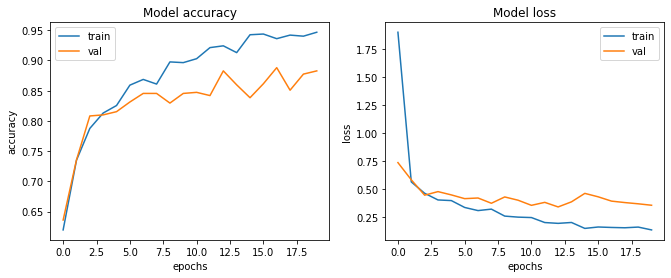

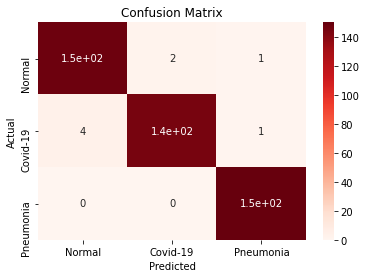

In [ ]:
(cus_his, custom_mod) = fit_model(custom_mod, 'Custom')
display_history(cus_his)
plot_metrices(custom_mod)
custom_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/custom.h5')

### VGG16

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
53/53 [==============================] - 39s 611ms/step - loss: 1.8763 - accuracy: 0.5757 - val_loss: 0.5563 - val_accuracy: 0.7709
Epoch 2/20
53/53 [==============================] - 22s 423ms/step - loss: 0.7199 - accuracy: 0.7077 - val_loss: 0.4959 - val_accuracy: 0.7886
Epoch 3/20
53/53 [==============================] - 22s 420ms/step - loss: 0.6007 - accuracy: 0.7509 - val_loss: 0.4407 - val_accuracy: 0.8064
Epoch 4/20
53/53 [==============================] - 22s 423ms/step - loss: 0.5573 - accuracy: 0.7645 - val_loss: 0.3956 - val_accuracy: 0.8472
Epoch 5/20
53/53 [==============================] - 22s 424ms/step - loss: 0.4675 - accuracy: 0.8006 - val_loss: 0.3581 - val_accuracy: 0.8632
Epoch 6/20
53/53 [==============================] - 23s 443ms/step - loss: 0.4726 - accuracy: 0.8065 - val_loss: 0.3965 - val_accuracy: 0.8437
Epoch 7/20
53/53 [==============================] - 23s 434ms/step - loss: 0.4257 - accuracy: 0.8178 - val_loss: 0.3541 - val_accuracy: 0.8384

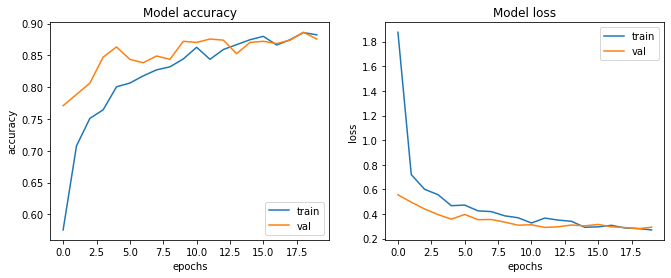

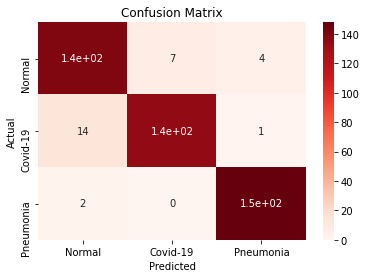

In [ ]:
(vgg_his, vgg_mod)= fit_model(vgg_mod, 'VGG16')
display_history(vgg_his)
plot_metrices(vgg_mod)
vgg_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/vgg.h5')

### ResNet-101

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
53/53 [==============================] - 31s 486ms/step - loss: 0.6814 - accuracy: 0.7154 - val_loss: 0.3671 - val_accuracy: 0.8295
Epoch 2/20
53/53 [==============================] - 24s 448ms/step - loss: 0.4499 - accuracy: 0.8118 - val_loss: 0.3408 - val_accuracy: 0.8437
Epoch 3/20
53/53 [==============================] - 24s 444ms/step - loss: 0.3742 - accuracy: 0.8491 - val_loss: 0.3173 - val_accuracy: 0.8632
Epoch 4/20
53/53 [==============================] - 24s 444ms/step - loss: 0.3314 - accuracy: 0.8586 - val_loss: 0.3291 - val_accuracy: 0.8579
Epoch 5/20
53/53 [==============================] - 23s 442ms/step - loss: 0.3248 - accuracy: 0.8639 - val_loss: 0.2915 - val_accuracy: 0.8828
Epoch 6/20
53/53 [==============================] - 23s 443ms/step - loss: 0.2806 - accuracy: 0.8846 - val_loss: 0.2609 - val_accuracy: 0.8845
Epoch 7/20
53/53 [==============================] - 23s 443ms/step - loss: 0.2851 - accuracy: 0.8893 - val_loss: 0.2753 - val_accuracy: 0.8934

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


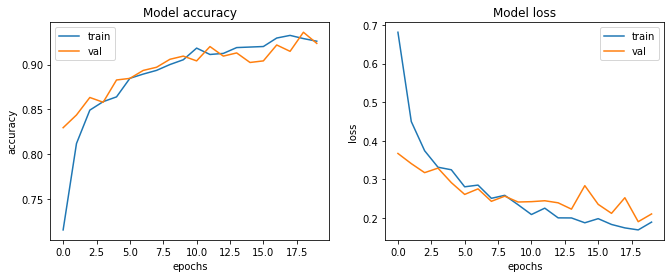

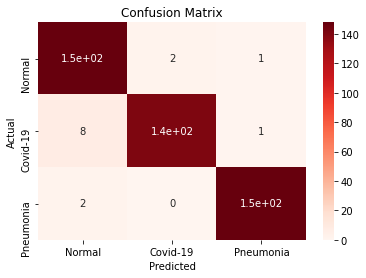

In [ ]:
res_his, resnet101_mod = fit_model(resnet101_mod, 'ResNet101')
display_history(res_his)
plot_metrices(resnet101_mod)
resnet101_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/resnet.h5')

### Xception

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
53/53 [==============================] - 29s 468ms/step - loss: 9.4516 - accuracy: 0.4888 - val_loss: 0.9999 - val_accuracy: 0.4565
Epoch 2/20
53/53 [==============================] - 22s 412ms/step - loss: 1.0016 - accuracy: 0.4775 - val_loss: 0.8272 - val_accuracy: 0.6057
Epoch 3/20
53/53 [==============================] - 22s 410ms/step - loss: 0.9101 - accuracy: 0.5178 - val_loss: 0.7320 - val_accuracy: 0.6625
Epoch 4/20
53/53 [==============================] - 22s 413ms/step - loss: 0.8787 - accuracy: 0.5722 - val_loss: 0.7794 - val_accuracy: 0.6625
Epoch 5/20
53/53 [==============================] - 22s 410ms/step - loss: 0.8340 - accuracy: 0.5876 - val_loss: 0.6358 - val_accuracy: 0.7140
Epoch 6/20
53/53 [==============================] - 22s 412ms/step - loss: 0.8264 - accuracy: 0.5751 - val_loss: 0.6374 - val_accuracy: 0.6909
Epoch 7/20
53/53 [==============================] - 22s 411ms/step - loss: 0.8208 - accuracy: 0.5746 - val_loss: 0.7026 - val_accuracy: 0.6607

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


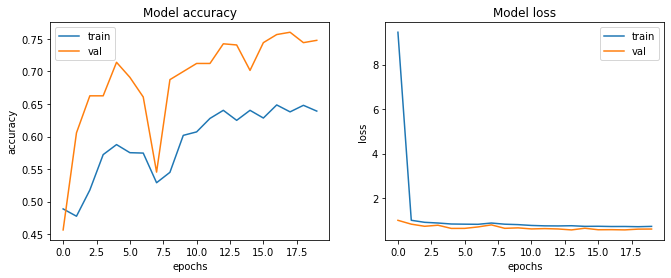

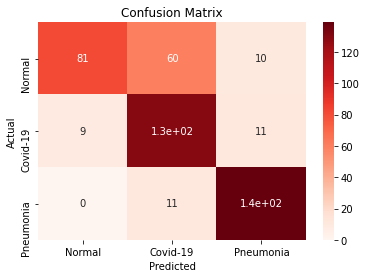

In [ ]:
xcep_his, xception_mod = fit_model(xception_mod, 'Xception')
display_history(xcep_his)
plot_metrices(xception_mod)
xception_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/xception.h5')

### ResNet-50

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
53/53 [==============================] - 25s 418ms/step - loss: 0.6745 - accuracy: 0.7213 - val_loss: 0.3944 - val_accuracy: 0.8455
Epoch 2/20
53/53 [==============================] - 21s 397ms/step - loss: 0.4117 - accuracy: 0.8195 - val_loss: 0.3331 - val_accuracy: 0.8668
Epoch 3/20
53/53 [==============================] - 21s 397ms/step - loss: 0.3688 - accuracy: 0.8497 - val_loss: 0.3218 - val_accuracy: 0.8686
Epoch 4/20
53/53 [==============================] - 21s 400ms/step - loss: 0.3509 - accuracy: 0.8568 - val_loss: 0.2783 - val_accuracy: 0.8934
Epoch 5/20
53/53 [==============================] - 21s 396ms/step - loss: 0.3175 - accuracy: 0.8734 - val_loss: 0.2618 - val_accuracy: 0.8845
Epoch 6/20
53/53 [==============================] - 21s 395ms/step - loss: 0.3125 - accuracy: 0.8746 - val_loss: 0.2663 - val_accuracy: 0.8970
Epoch 7/20
53/53 [==============================] - 21s 397ms/step - loss: 0.2892 - accuracy: 0.8888 - val_loss: 0.2357 - val_accuracy: 0.8988

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


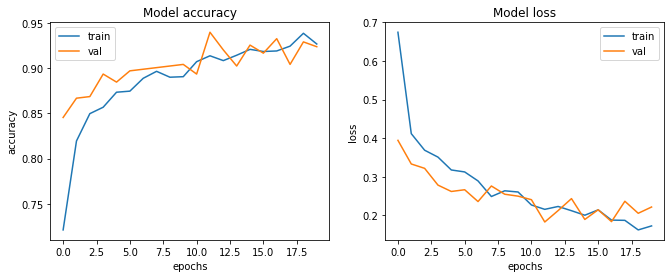

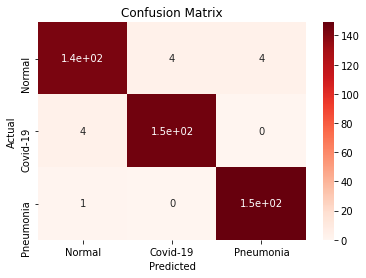

In [ ]:
resnet50_his, resnet50_mod = fit_model(resnet50_mod, 'ResNet50')
display_history(resnet50_his)
plot_metrices(resnet50_mod)
resnet50_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/resnet50.h5')

### ResNet-50 V2

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
53/53 [==============================] - 25s 422ms/step - loss: 23.6743 - accuracy: 0.4231 - val_loss: 1.0885 - val_accuracy: 0.4600
Epoch 2/20
53/53 [==============================] - 21s 390ms/step - loss: 1.0627 - accuracy: 0.3805 - val_loss: 1.0115 - val_accuracy: 0.4210
Epoch 3/20
53/53 [==============================] - 21s 388ms/step - loss: 1.0947 - accuracy: 0.4006 - val_loss: 1.1324 - val_accuracy: 0.4760
Epoch 4/20
53/53 [==============================] - 21s 392ms/step - loss: 1.0337 - accuracy: 0.4432 - val_loss: 0.9550 - val_accuracy: 0.6039
Epoch 5/20
53/53 [==============================] - 20s 386ms/step - loss: 1.0155 - accuracy: 0.4473 - val_loss: 0.9755 - val_accuracy: 0.5968
Epoch 6/20
53/53 [==============================] - 20s 387ms/step - loss: 1.0819 - accuracy: 0.3633 - val_loss: 1.0129 - val_accuracy: 0.5311
Epoch 7/20
53/53 [==============================] - 21s 389ms/step - loss: 1.0380 - accuracy: 0.4574 - val_loss: 0.9188 - val_accuracy: 0.637

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


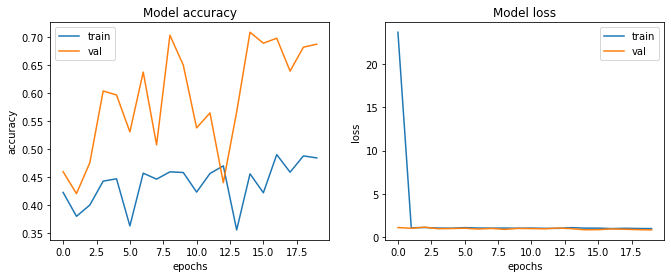

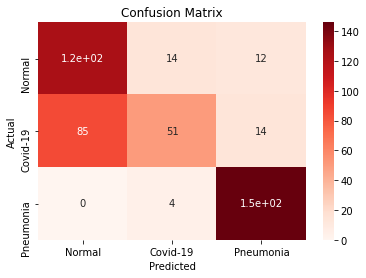

In [ ]:
resnet50v2_his, resnet50v2_mod = fit_model(resnet50v2_mod, 'ResNet50V2')
display_history(resnet50v2_his)
plot_metrices(resnet50v2_mod)
resnet50v2_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/resnet50v2.h5')

### InceptionV3 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
53/53 [==============================] - 28s 449ms/step - loss: 5.4580 - accuracy: 0.5195 - val_loss: 0.7629 - val_accuracy: 0.6217
Epoch 2/20
53/53 [==============================] - 21s 389ms/step - loss: 0.9483 - accuracy: 0.4828 - val_loss: 0.9000 - val_accuracy: 0.6519
Epoch 3/20
53/53 [==============================] - 21s 391ms/step - loss: 0.9314 - accuracy: 0.5036 - val_loss: 0.7873 - val_accuracy: 0.6750
Epoch 4/20
53/53 [==============================] - 21s 389ms/step - loss: 0.9193 - accuracy: 0.4899 - val_loss: 0.8472 - val_accuracy: 0.6288
Epoch 5/20
53/53 [==============================] - 21s 390ms/step - loss: 0.8915 - accuracy: 0.4941 - val_loss: 0.7121 - val_accuracy: 0.6536
Epoch 6/20
53/53 [==============================] - 21s 390ms/step - loss: 0.8868 - accuracy: 0.4769 - val_loss: 0.6835 - val_accuracy: 0.7069
Epoch 7/20
53/53 [==============================] - 21s 395ms/step - loss: 0.8793 - accuracy: 0.4811 - val_loss: 0.7243 - val_accuracy: 0.6785

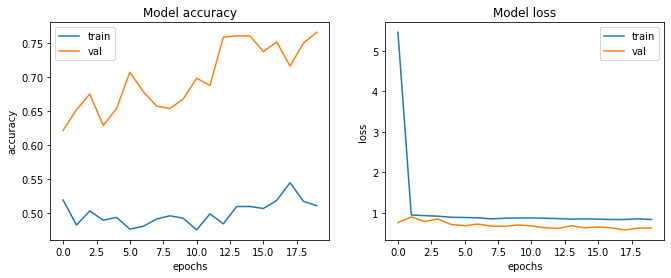

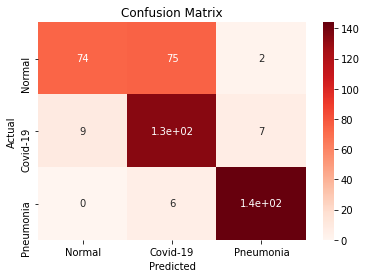

In [ ]:
inceptionv3_his, inceptionv3_mod = fit_model(inceptionv3_mod, 'InceptionV3')
display_history(inceptionv3_his)
plot_metrices(inceptionv3_mod)
inceptionv3_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/inceptionv3.h5')

### MobileNetV2

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
53/53 [==============================] - 23s 395ms/step - loss: 0.8926 - accuracy: 0.5645 - val_loss: 0.6249 - val_accuracy: 0.7407
Epoch 2/20
53/53 [==============================] - 20s 373ms/step - loss: 0.6485 - accuracy: 0.6905 - val_loss: 0.5354 - val_accuracy: 0.7531
Epoch 3/20
53/53 [==============================] - 20s 371ms/step - loss: 0.5900 - accuracy: 0.7349 - val_loss: 0.4966 - val_accuracy: 0.7940
Epoch 4/20
53/53 [==============================] - 20s 375ms/step - loss: 0.5516 - accuracy: 0.7349 - val_loss: 0.4985 - val_accuracy: 0.7940
Epoch 5/20
53/53 [==============================] - 20s 375ms/step - loss: 0.5194 - accuracy: 0.7598 - val_loss: 0.4545 - val_accuracy: 0.8171
Epoch 6/20
53/53 [==============================] - 21s 388ms/step - loss: 0.5044 - accuracy: 0.7704 - val_loss: 0.4510 - val_accuracy: 0.8153
Epoch 7/20
53/53 [==============================] - 21s 388ms/step - loss: 0.4745 - accuracy: 0.7852 - val_loss: 0.4513 - val_accuracy: 0.8046

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


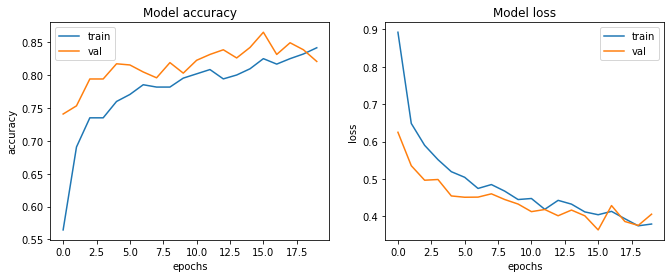

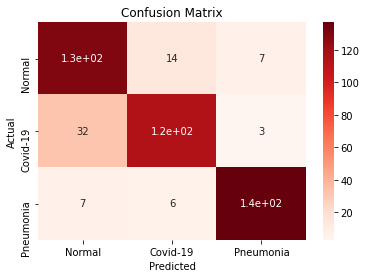

In [ ]:
mobilenetv2_his, mobilenetv2_mod = fit_model(mobilenetv2_mod, 'MobileNetV2')
display_history(mobilenetv2_his)
plot_metrices(mobilenetv2_mod)
mobilenetv2_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/mobilenetv2.h5')

### DenseNet-121

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
53/53 [==============================] - 32s 477ms/step - loss: 1.6290 - accuracy: 0.5296 - val_loss: 0.7139 - val_accuracy: 0.7034
Epoch 2/20
53/53 [==============================] - 21s 400ms/step - loss: 0.8108 - accuracy: 0.6385 - val_loss: 0.6355 - val_accuracy: 0.7318
Epoch 3/20
53/53 [==============================] - 21s 400ms/step - loss: 0.7331 - accuracy: 0.6657 - val_loss: 0.5987 - val_accuracy: 0.7425
Epoch 4/20
53/53 [==============================] - 21s 401ms/step - loss: 0.6720 - accuracy: 0.6947 - val_loss: 0.5237 - val_accuracy: 0.7780
Epoch 5/20
53/53 [==============================] - 21s 396ms/step - loss: 0.6431 - accuracy: 0.7024 - val_loss: 0.5151 - val_accuracy: 0.7833
Epoch 6/20
53/53 [==============================] - 21s 395ms/step - loss: 0.6236 - accuracy: 0.7124 - val_loss: 0.5198 - val_accuracy: 0.7798
Epoch 7/20
53/53 [==============================] - 21s 396ms/step - loss: 0.5970 - accuracy: 0.7183 - val_loss: 0.5227 - val_accuracy: 0.7780

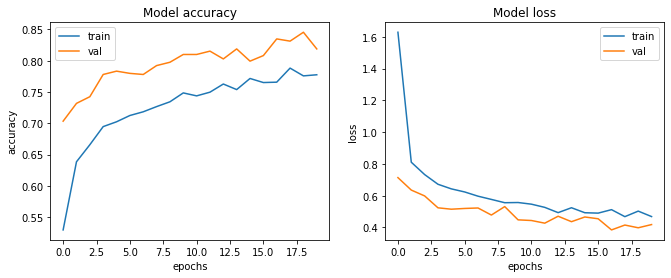

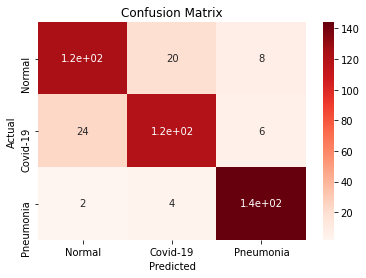

In [ ]:
densenet121_his, densenet121_mod = fit_model(densenet121_mod, 'DenseNet121')
display_history(densenet121_his)
plot_metrices(densenet121_mod)
densenet121_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/densenet121.h5')

### ResNet-101 V2 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
53/53 [==============================] - 29s 450ms/step - loss: 32.5412 - accuracy: 0.3811 - val_loss: 1.0986 - val_accuracy: 0.3481
Epoch 2/20
53/53 [==============================] - 22s 421ms/step - loss: 1.1091 - accuracy: 0.3284 - val_loss: 1.0986 - val_accuracy: 0.3481
Epoch 3/20
53/53 [==============================] - 22s 423ms/step - loss: 1.0987 - accuracy: 0.3243 - val_loss: 1.0987 - val_accuracy: 0.3197
Epoch 4/20
53/53 [==============================] - 22s 420ms/step - loss: 1.0986 - accuracy: 0.3379 - val_loss: 1.0987 - val_accuracy: 0.3197
Epoch 5/20
53/53 [==============================] - 22s 422ms/step - loss: 1.0987 - accuracy: 0.3379 - val_loss: 1.0988 - val_accuracy: 0.3197
Epoch 6/20
53/53 [==============================] - 22s 422ms/step - loss: 1.0986 - accuracy: 0.3379 - val_loss: 1.0988 - val_accuracy: 0.3197
Epoch 7/20
53/53 [==============================] - 22s 420ms/step - loss: 1.0986 - accuracy: 0.3379 - val_loss: 1.0989 - val_accuracy: 0.319

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00       151
           1       0.33      1.00      0.50       150
           2       0.00      0.00      0.00       150

    accuracy                           0.33       451
   macro avg       0.11      0.33      0.17       451
weighted avg       0.11      0.33      0.17       451

ACC: 0.3326
Sensitivity: 0.0000
Specificity: 1.0000


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


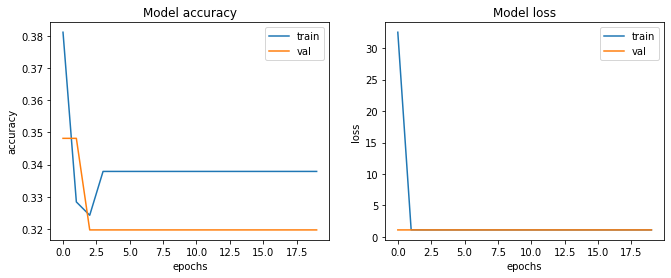

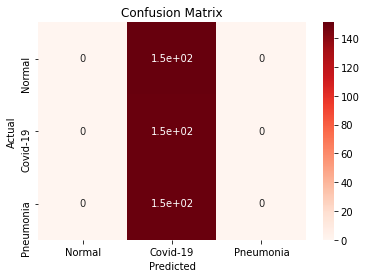

In [29]:
resnet101v2_his, resnet101v2_mod = fit_model(resnet101v2_mod, 'ResNet101V2')
display_history(resnet101v2_his)
plot_metrices(resnet101v2_mod)
resnet101v2_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/resnet101v2.h5')

### InceptionResNetV2

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/20
53/53 [==============================] - 35s 502ms/step - loss: 44.4957 - accuracy: 0.3402 - val_loss: 1.1075 - val_accuracy: 0.3197
Epoch 2/20
53/53 [==============================] - 23s 438ms/step - loss: 1.1042 - accuracy: 0.3379 - val_loss: 1.0982 - val_accuracy: 0.3215
Epoch 3/20
53/53 [==============================] - 23s 436ms/step - loss: 1.0986 - accuracy: 0.3379 - val_loss: 1.0985 - val_accuracy: 0.3215
Epoch 4/20
53/53 [==============================] - 23s 438ms/step - loss: 1.0987 - accuracy: 0.3379 - val_loss: 1.0988 - val_accuracy: 0.3215
Epoch 5/20
53/53 [==============================] - 23s 438ms/step - loss: 1.0987 - accuracy: 0.3379 - val_loss: 1.0989 - val_accuracy: 0.3197
Epoch 6/20
53/53 [==============================] - 23s 437ms/step - loss: 1.0987 - accuracy: 0.3379 - val_loss: 1.0984 - val_accuracy: 0.3215
Epoch 7/20
53/53 [==============================] - 23s 437ms/step - loss: 1.0986 - accuracy: 0.3379 - val_loss: 1.0982 - val_accuracy: 0.321

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00       151
           1       0.33      1.00      0.50       150
           2       0.00      0.00      0.00       150

    accuracy                           0.33       451
   macro avg       0.11      0.33      0.17       451
weighted avg       0.11      0.33      0.17       451

ACC: 0.3326
Sensitivity: 0.0000
Specificity: 1.0000


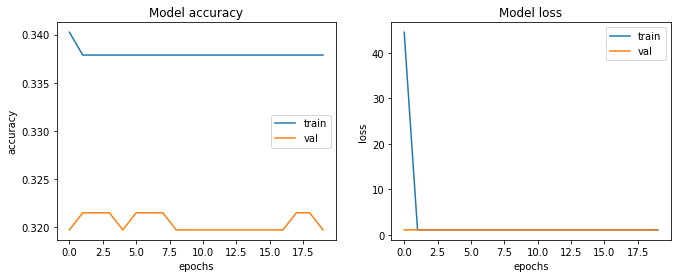

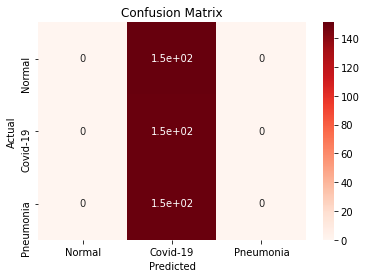

In [30]:
inceptionresnetv2_his, inceptionresnetv2_mod = fit_model(inceptionresnetv2_mod, 'InceptionResNetV2')
display_history(inceptionresnetv2_his)
plot_metrices(inceptionresnetv2_mod)
inceptionresnetv2_mod.save('/content/gdrive/My Drive/Colab Notebooks/cnn-covid/inceptionresnetv2.h5')

# Exibindo os Resultados

### Custom Model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

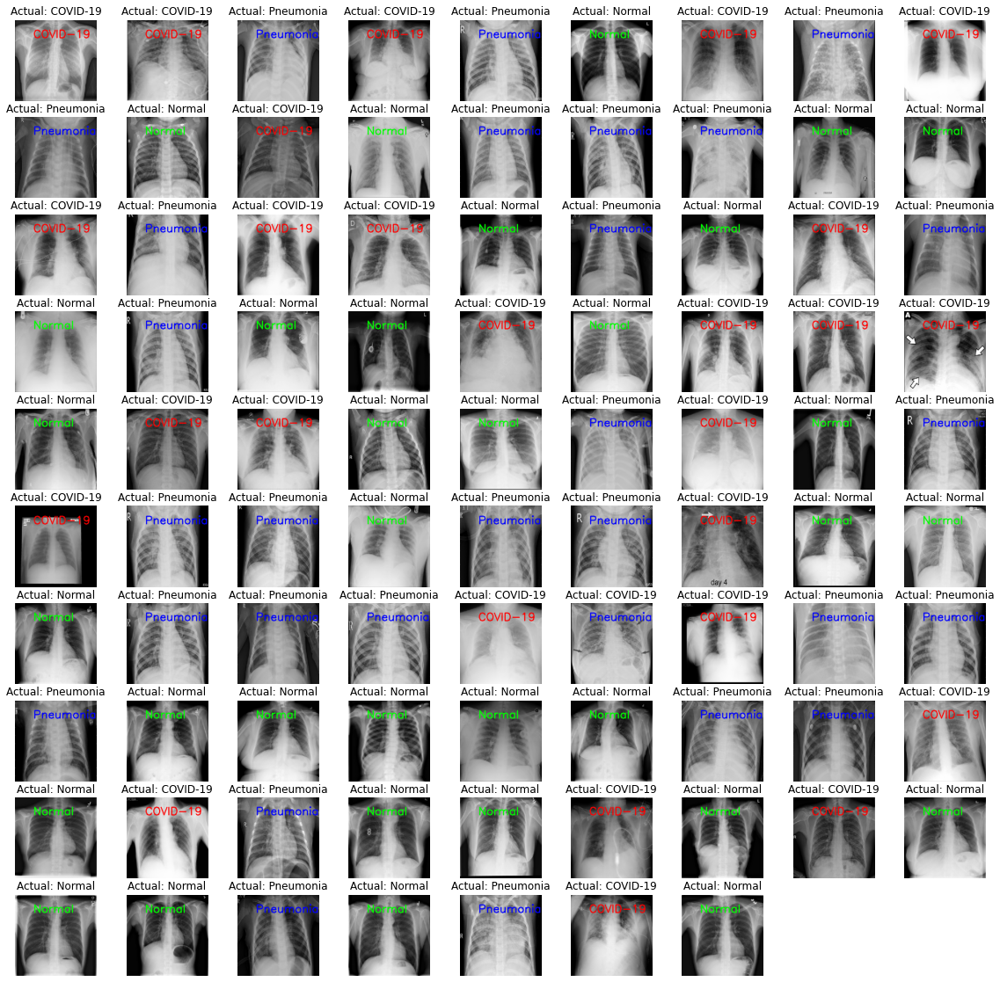

In [132]:
display_results(custom_mod)

### VGG16

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

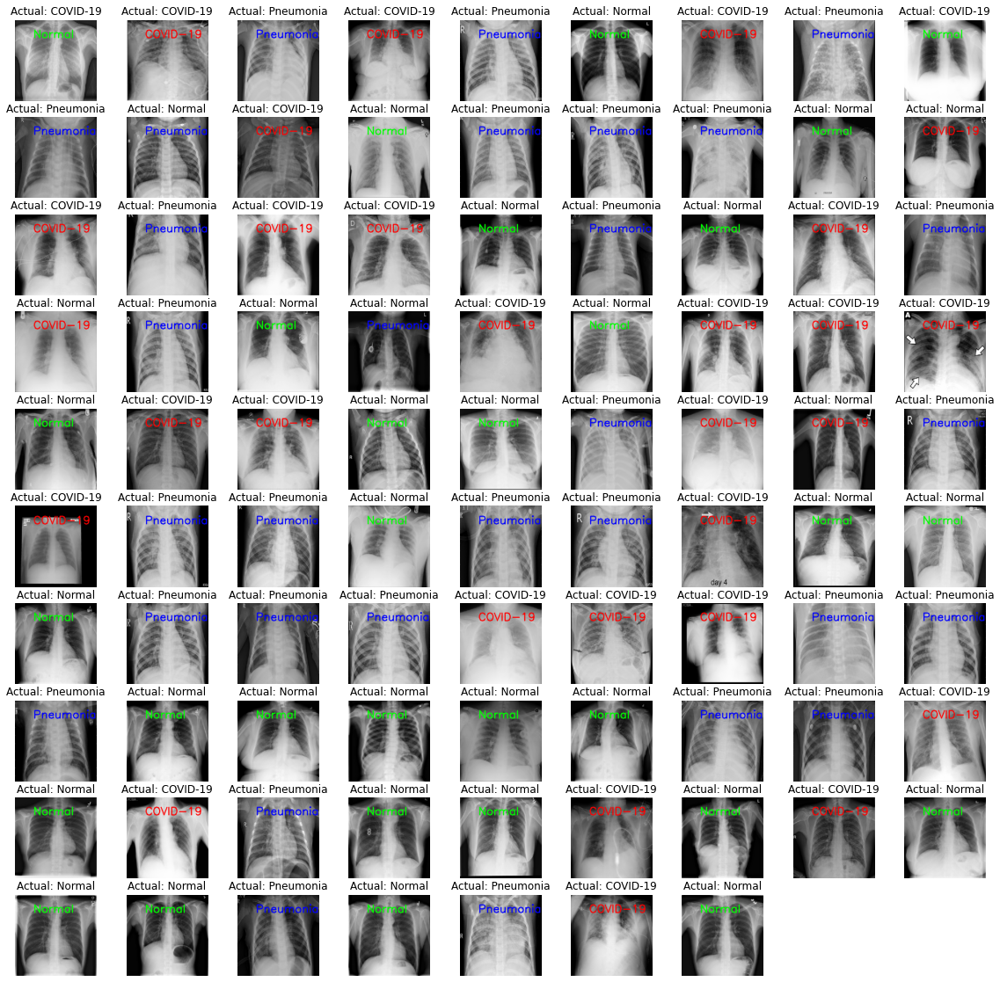

In [133]:
display_results(vgg_mod)

### ResNet-101

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

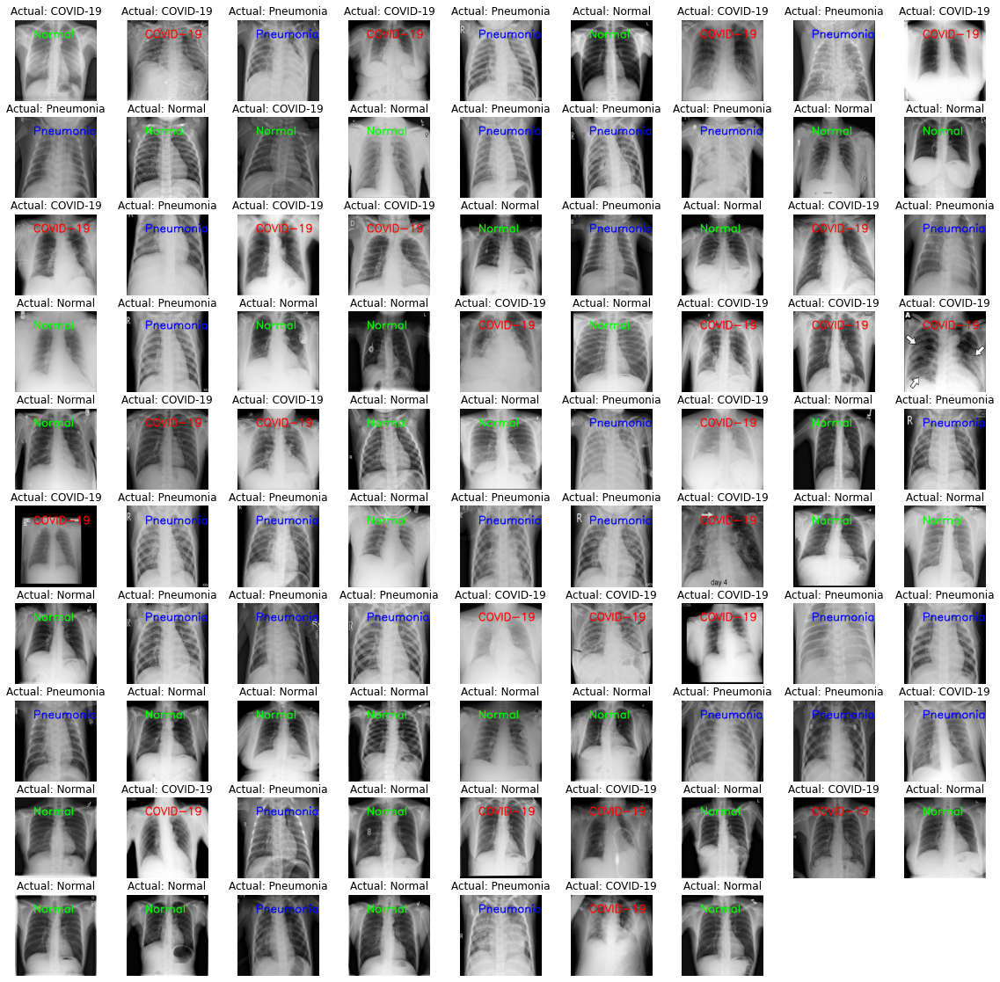

In [134]:
display_results(resnet101_mod)

### Xception

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

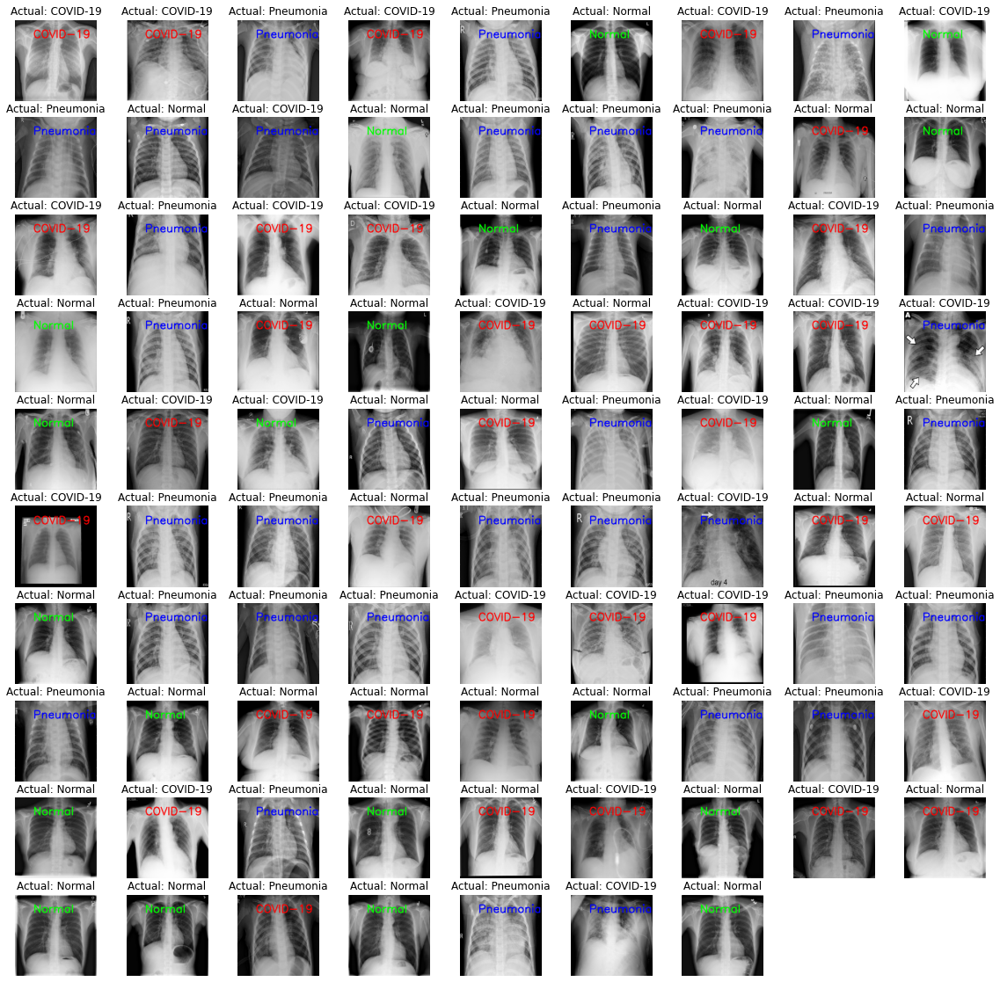

In [135]:
display_results(xception_mod)

### ResNet-50

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

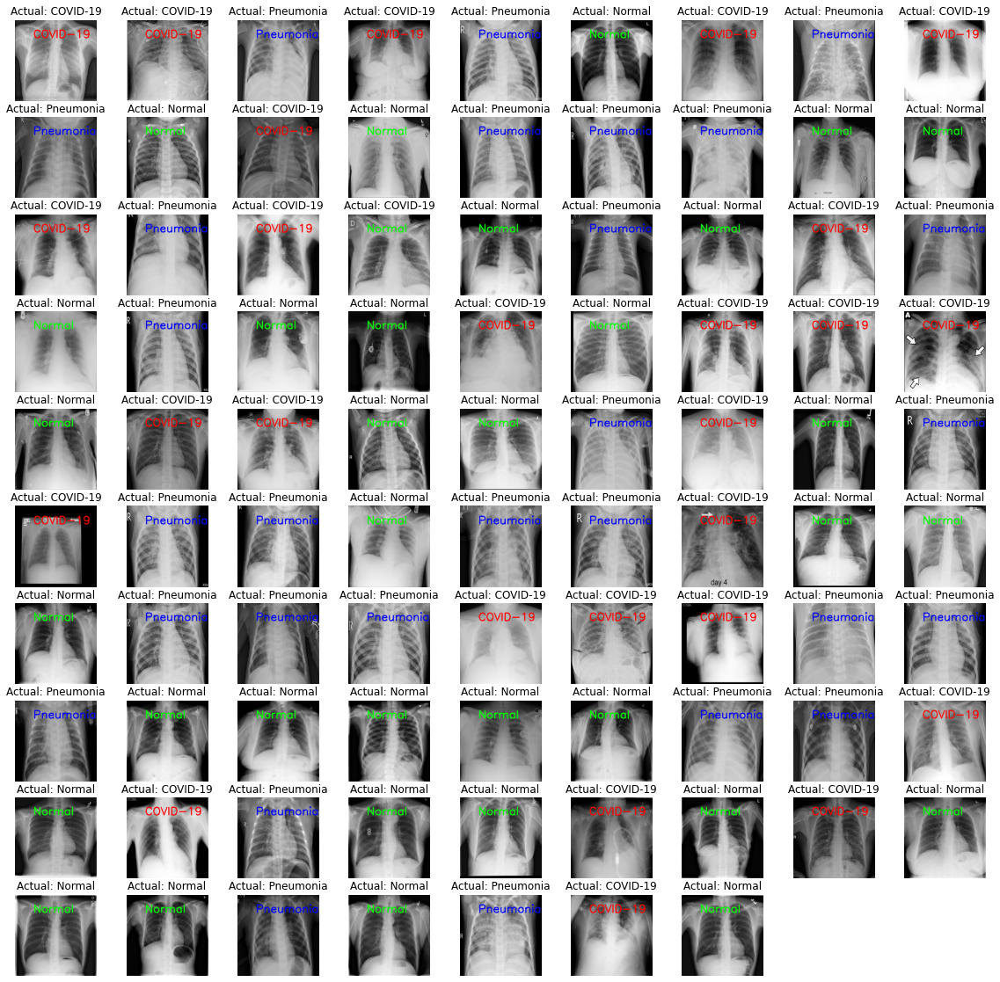

In [136]:
display_results(resnet50_mod)

### ResNet-50 V2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

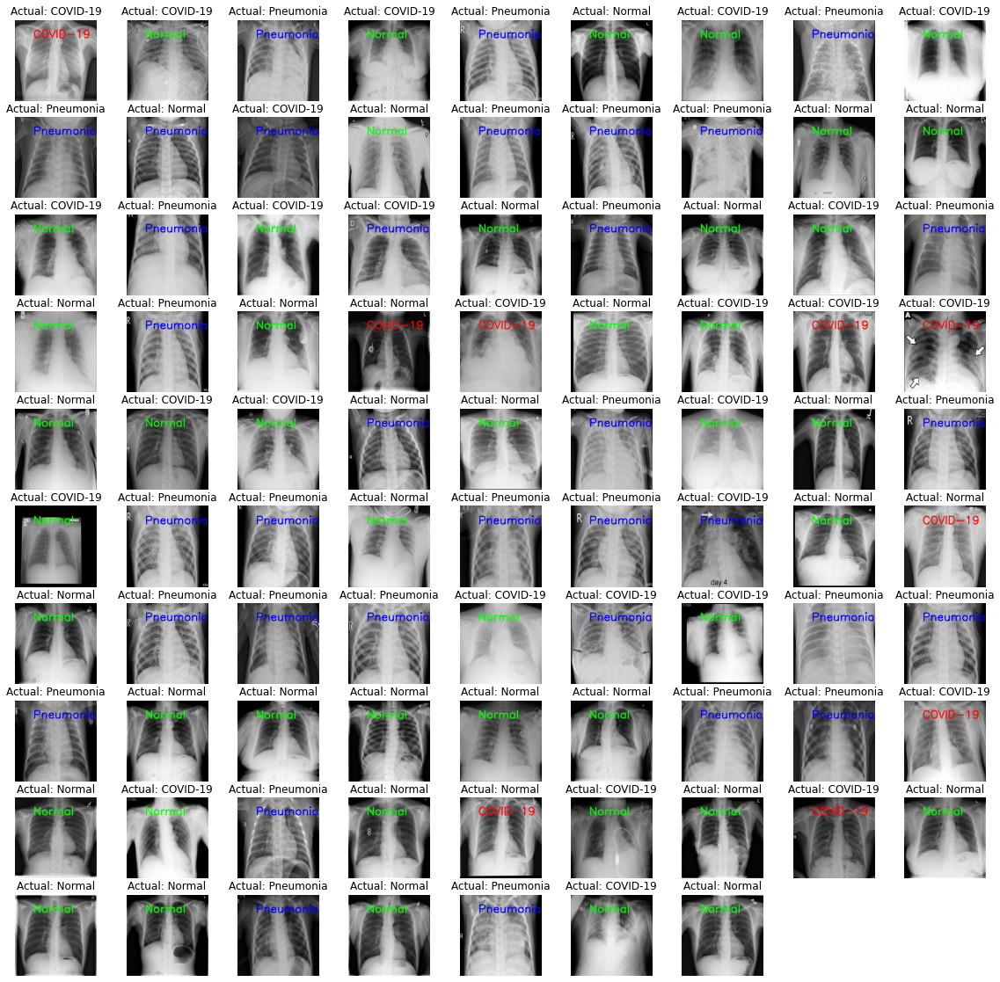

In [137]:
display_results(resnet50v2_mod)

### InceptionV3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

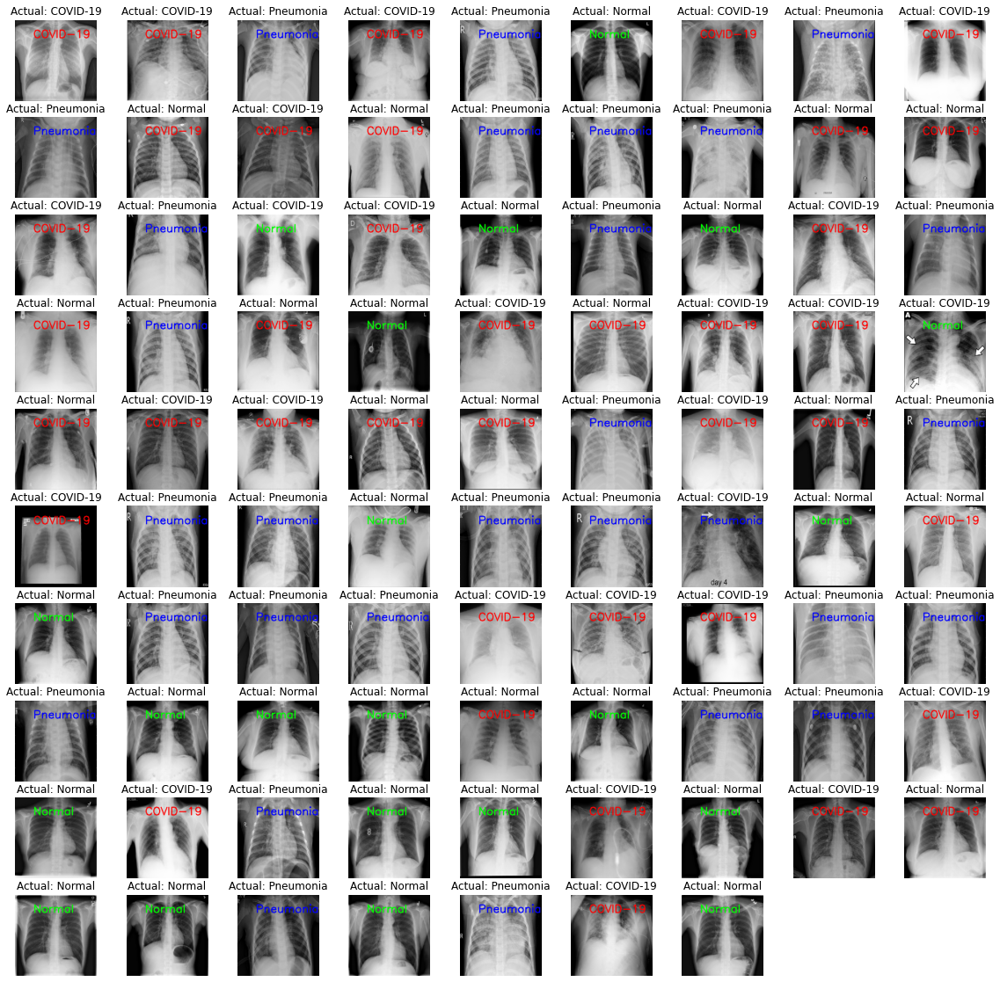

In [138]:
display_results(inceptionv3_mod)

### MobileNetV2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

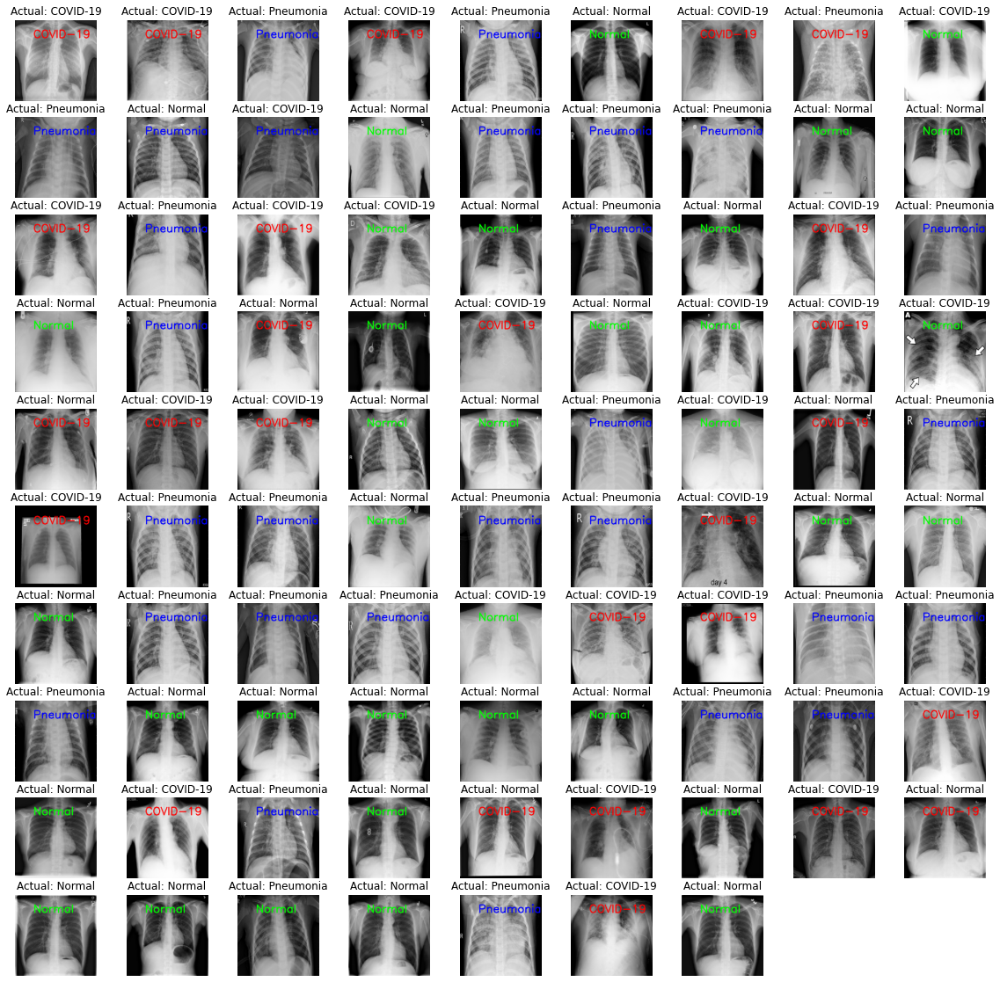

In [139]:
display_results(mobilenetv2_mod)

### DenseNet-121

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

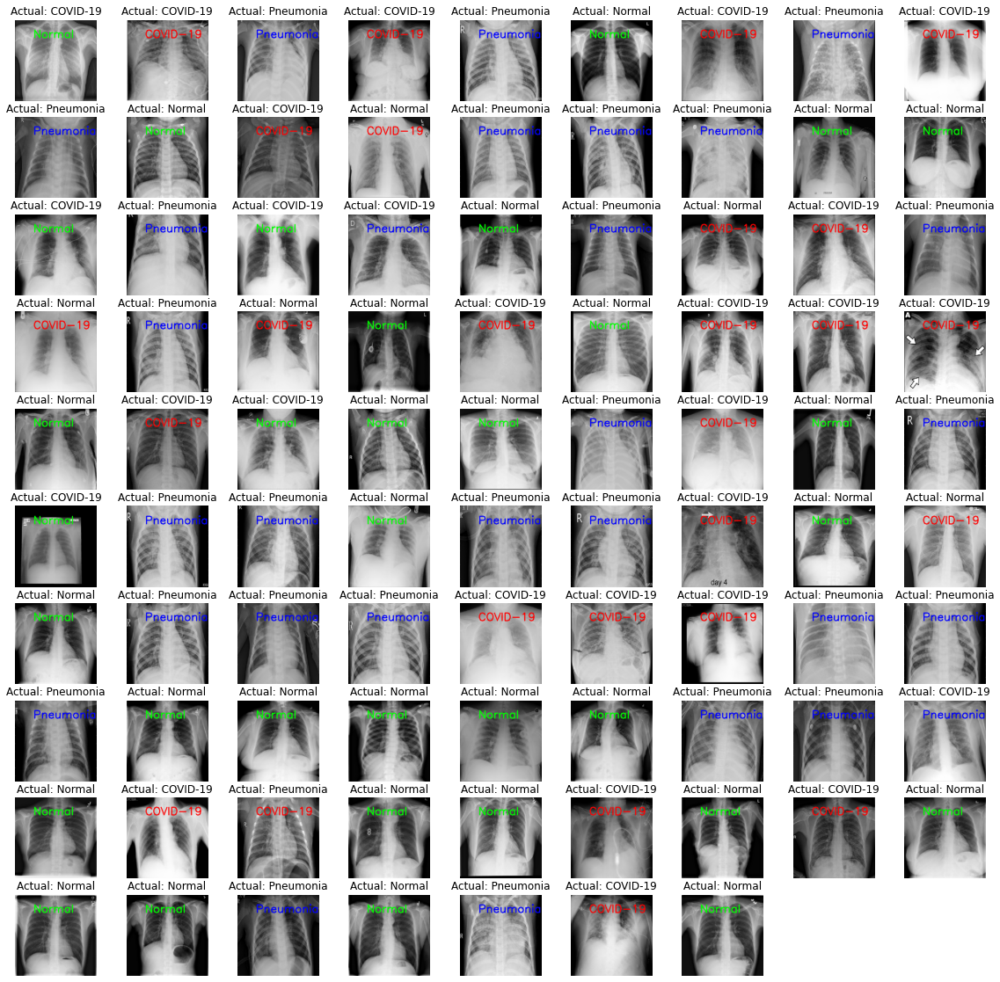

In [140]:
display_results(densenet121_mod)

### ResNet-101 V2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

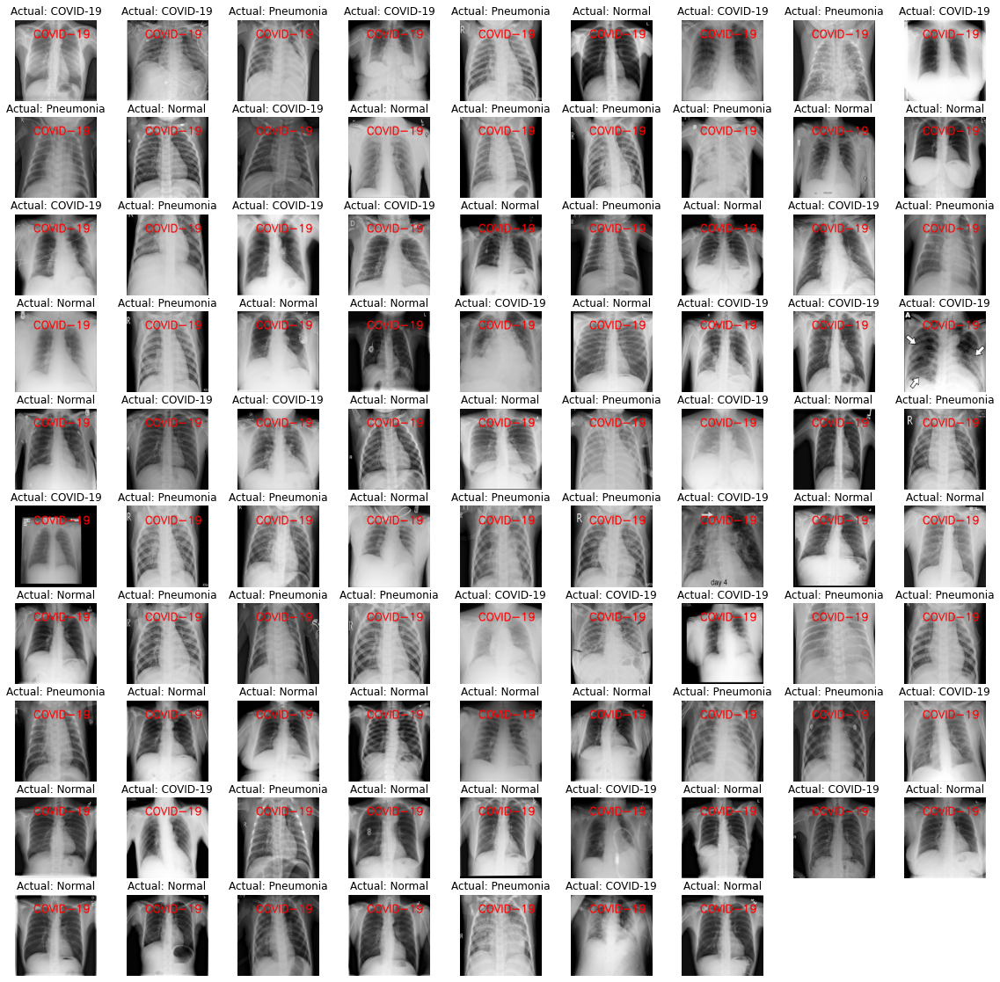

In [141]:
display_results(resnet101v2_mod)

### InceptionResNetV2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

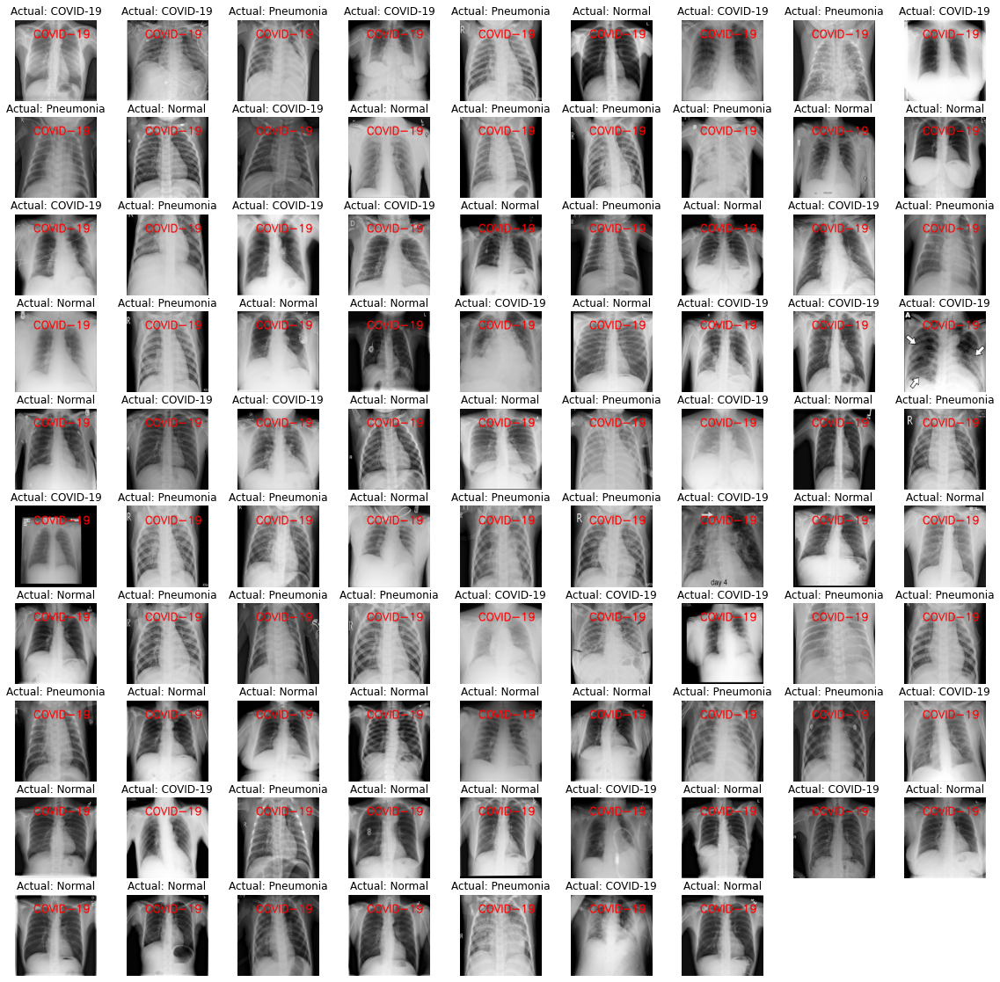

In [142]:
display_results(inceptionresnetv2_mod)